In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        os.path.join(dirname, filename)
        #print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [2]:
#os.getcwd()
#os.listdir('/kaggle/input/')
os.listdir('/kaggle/input/landfillwaste/dataset/ML')

['Training', 'Testing']

In [3]:
os.listdir('/kaggle/input/landfillwaste/prediction')

['Test']

# Step 1: Gather Data and Identify the Deep Learning Problem
 - Convolutional Neural Networks (CNN), are a powerful deep learning models for multiclass image classification problems. 
 
 - The dataset consists of a collection of 4752 raw color images of landfill waste produced by humans and societal activities.
 
 - The Dataset is obtained from UCI Machine Learning Respository, with a research paper on " *** RealWaste: A Novel Real-Life Data Set for Landfill Waste Classification Using Deep Learning *** " By Sam Single, Saeid Iranmanesh, Raad Raad. Published in 2023.
 
 - Research paper link:  https://www.mdpi.com/2078-2489/14/12/633
 
 - The images have a resolution of 524 X 524, and are collected from 9 different material type. They are listed below with the following labels and their count:
   - Cardboard - 461
   - Food Organics - 411
   - Glass - 420
   - Metal - 790
   - Miscellaneous Trash - 495
   - Paper - 500
   - Plastic - 921
   - Textile Trash - 318
   - Vegetation - 436
   
 
 -  This project aims to understand the CV tasks such as preprocessing, feature extraction and image classification by using multiple CNN architectures on Landfill Waste images and compare their performances.
 
 -  By applying Image preocessing and Deep Learning with computer vision techniques, we can automate waste detection and classification based on visual characterisitcs for efficient sorting and recycling efforts as mentioned     in the research paper. 
 
 -  The reasearch paper used **VGG-16, InceptionResNetV2, DenseNet121, Inception V3, and MobileNetV2** models to classify real-life waste.
 
 -  I will use 3 CNN models:  1 **Simple CNN** model from scratch, and 2 **pretrained models - (ResNet-50 and Xception)** and compare their performances based on accuracy and loss.
 
 -  This results from this study will be useful for implementing long-term monitoring of waste sorting quality that enables decision support for waste management systems and further reearch on consumer behavior.  
 
 

### Resources:

- 1. RealWaste: A Novel Real-Life Data Set for Landfill Waste Classification Using Deep Learning - https://www.mdpi.com/2078-2489/14/12/633
- 2. Detecting glass and metal in consumer trash bags during waste collection using convolutional neural networks - https://www.sciencedirect.com/science/article/pii/S0956053X20305432
- 3. Simple Image Classification with ResNet-50 - https://medium.com/@nina95dan/simple-image-classification-with-resnet-50-334366e7311a
- 4. Exploring ResNet50: An In-Depth Look at the Model Architecture and Code Implementation - https://medium.com/@nitishkundu1993/exploring-resnet50-an-in-depth-look-at-the-model-architecture-and-code-implementation-d8d8fa67e46f
- 5. Xception: Deep Learning with Depthwise Separable Convolutions - https://arxiv.org/pdf/1610.02357v3
- 6. Classification with KerasHub - https://keras.io/guides/keras_hub/classification_with_keras_hub/

## Import all necessary libraries

In [4]:
#ignore warnings 
import warnings
warnings.filterwarnings('ignore')

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import random, os, glob 
import cv2
from PIL import Image
import seaborn as sns 
import matplotlib.pyplot as plt
import re
import itertools
import operator



import skimage
from skimage import io 
import sklearn
from sklearn.utils import shuffle
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

import tensorflow as tf
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import array_to_img, img_to_array, load_img
from tensorflow.keras.layers import Dense, Flatten
from tensorflow.keras.models import Model
from tensorflow.keras.applications.resnet50 import ResNet50, decode_predictions
from tensorflow.keras.applications.xception import Xception
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import CategoricalCrossentropy
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping

import keras
from keras import layers
from keras.preprocessing.image import load_img
from keras.preprocessing.image import img_to_array
from keras.models import Sequential, load_model
from keras.layers import Activation, BatchNormalization, Conv2D, MaxPooling2D, GlobalAveragePooling2D, Flatten, Dense, Dropout
from keras.preprocessing import image

## Load the Data (Images)
- The dataset has been split into 3 differednt folders - train, valid and test set .
- The train data has 4392 images.
- The valid data has 180 images.
- The test data has 180 images.

In [5]:
train_images_path = "/kaggle/input/landfillwaste/dataset/ML/Training"
validation_images_path = "/kaggle/input/landfillwaste/dataset/ML/Testing"
test_images_path = "/kaggle/input/landfillwaste/prediction/Test"

# Step 2: Exploratory Data Analysis - Image Preprocessing, Data Split, Augmentation
 - The dataset will be split into training and test data.
 - We will perform Image Preprocessing on the training data to enhance image quality which is vital for computer vision applications. 
 - There are sevral techniques used in **image preprocessing** such as **resizing,normalization,noise reduction etc**.
 - Image preprocessing also decreases model training time and increases model inference speed. 
 - If input images are particularly large, reducing the size of these images will dramatically improve model training time without significantly reducing model performance.
 - Resizing and cropping images is an important first step in image preprocessing.
 - Images come in all shapes and sizes, but standard size is often 224x224 or 256x256 pixels for computer vision applications.
 - It is important to normalize the pixel values to have a consistent brightness and improve contrast which makes the images more suitable for analysis and allows the models to learn patterns independent of lighting      conditions.
 - The most common normalization technique is rescaling the pixel values to range from 0 to 1.
 - Image filters are used to reduce noise, sharpen details, and overall improve the quality of the images before analysis.
 - **Data augmentation** is a technique used to artificially expand the size of the training dataset by generating new images from existing ones to increase variability in the dataset and reduce overfitting, thus improving the generalization of our model.
 - The most commonly used operations are - **Rotation, Shearing, Zooming, Cropping, Flipping, Changing the brightness level**
 - Image preprocessing steps are applied to training and test sets, whereas Image augmentation is only applied to the training data.

In [6]:
import cv2
# Load a sample image
img = cv2.imread('/kaggle/input/landfillwaste/dataset/ML/Training/Paper/Paper_108.jpg')
print(' Original Image shape:', img.shape)

 Original Image shape: (524, 524, 3)


## Preprocessing and Augmentation on the train dataset

In [7]:
# Split the dataset into Train and Test set

target_size = (224,224)
batch_size = 32

# Performing augmentation only on the training data
train = ImageDataGenerator(    
    rescale=1.0/255, # Normalize
    rotation_range= 10,
    #width_shift_range=0.2,
    #height_shift_range=0.2,
    zoom_range= 0.2,
    horizontal_flip = True,
    fill_mode='nearest',
    #brightness_range=[0.5, 1.5],  # Brightness adjustment
    #shear_range= 0.2,  # Shear transformation
    #channel_shift_range=0.2  # Channel intensity shift
)  


train_generator = train.flow_from_directory(train_images_path,
                                            batch_size= 32,
                                            shuffle=True,   
                                            seed = 1324,
                                            class_mode='categorical',
                                            target_size= target_size
                                            )



Found 4392 images belonging to 9 classes.


In [8]:
labels = {value: key for key, value in train_generator.class_indices.items()}

print("Label Mappings for classes present in the training dataset\n")
for key, value in labels.items():
    print(f"{key} : {value}")

Label Mappings for classes present in the training dataset

0 : Cardboard
1 : Food Organics
2 : Glass
3 : Metal
4 : Miscellaneous Trash
5 : Paper
6 : Plastic
7 : Textile Trash
8 : Vegetation


## Visualize the train set data

['Metal', 'Glass', 'Paper', 'Vegetation', 'Cardboard', 'Textile Trash', 'Food Organics', 'Plastic', 'Miscellaneous Trash']


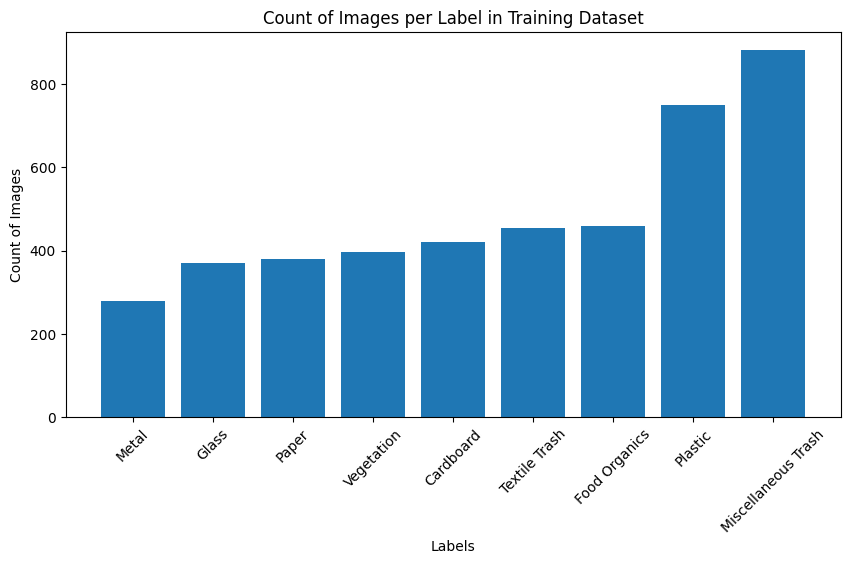

In [9]:
from collections import Counter
train_img = os.listdir(train_images_path)

# Get list of labels (directory names)
list_label = [d for d in os.listdir(train_images_path) if os.path.isdir(os.path.join(train_images_path, d))]
print(list_label)

 
# Count the number of images per label
image_count_per_label = Counter()
for label in list_label:
    image_count_per_label[label] = len(os.listdir(os.path.join(train_images_path, label)))

# Plotting the count of images per label
plt.figure(figsize=(10, 5))
plt.bar(image_count_per_label.keys(), sorted(image_count_per_label.values()))
plt.xlabel('Labels')
plt.ylabel('Count of Images')
plt.title('Count of Images per Label in Training Dataset')
plt.xticks(rotation=45)
plt.show()

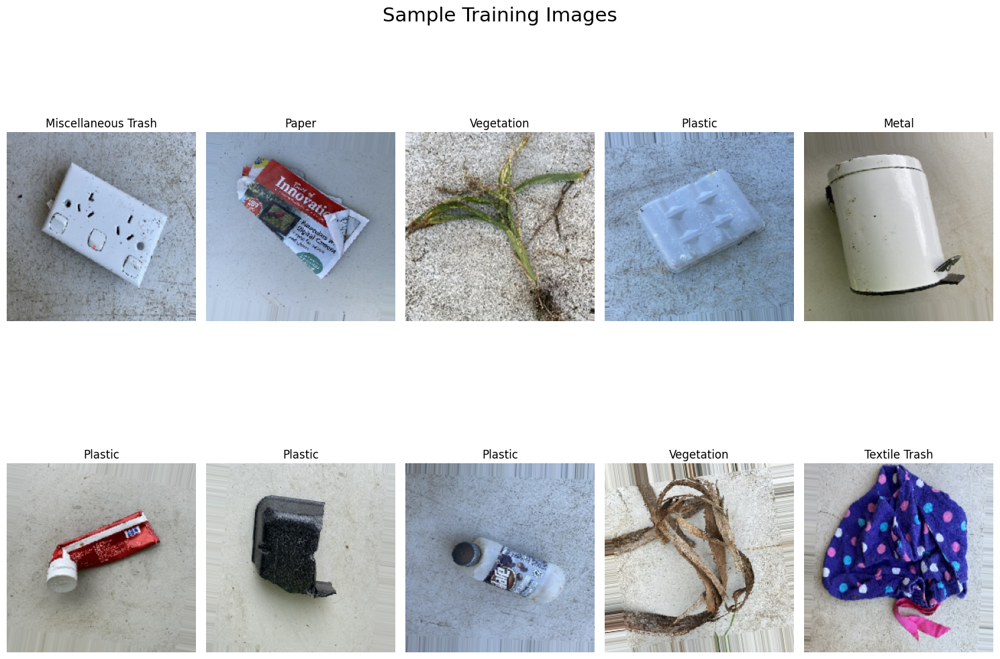

In [10]:
fig, ax = plt.subplots(nrows=2, ncols=5, figsize=(15, 12))
idx = 0

for i in range(2):
    for j in range(5):
        label = labels[np.argmax(train_generator[0][1][idx])]
        ax[i, j].set_title(f"{label}")
        ax[i, j].imshow(train_generator[0][0][idx][:, :, :])
        ax[i, j].axis("off")
        idx += 1

plt.tight_layout()
plt.suptitle("Sample Training Images", fontsize=21)
plt.show()

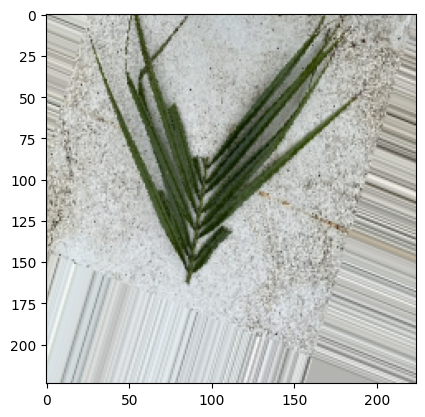

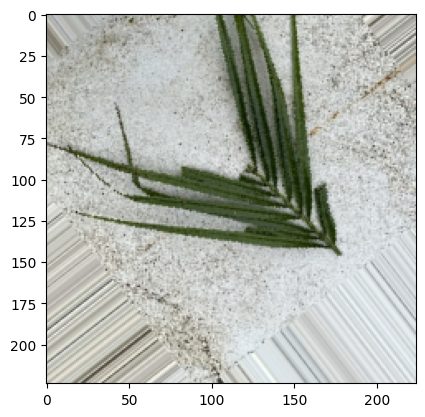

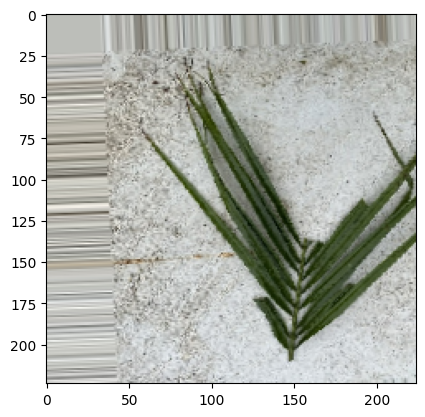

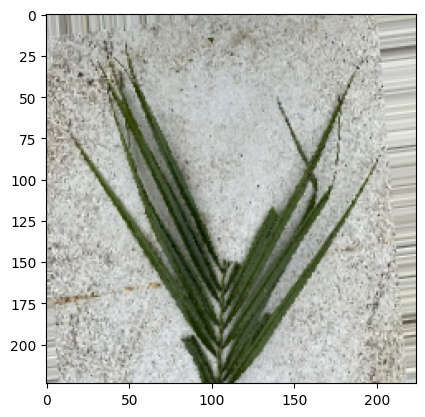

In [35]:
# Sample Images Augmented from test set for visualization purposes

#data augmentation configuration via ImageDataGenerator
datagen = ImageDataGenerator(
rotation_range= 40,
width_shift_range=0.2,
height_shift_range=0.2,
shear_range=0.2,
zoom_range=0.2,
horizontal_flip=True,
fill_mode='nearest')


#Let's display some randomly augmented training images

from keras.preprocessing import image
fnames = [os.path.join(test_images_path, fname) for fname in os.listdir(test_images_path)]
img_path = fnames[3]
img = image.load_img(img_path, target_size=(224, 224))
x = image.img_to_array(img)

x = x.reshape((1,) + x.shape)
i = 0
for batch in datagen.flow(x, batch_size=1):
    plt.figure(i)
    imgplot = plt.imshow(image.array_to_img(batch[0]))
    i += 1
    if i % 4 == 0:
        break
plt.show()


## Preprocessing on the validation dataset

In [36]:
valid = ImageDataGenerator(rescale =1.0/255) # Normalize
valid_generator = valid.flow_from_directory(validation_images_path,
                                          shuffle=True,
                                          batch_size = 32,
                                          seed = 1234,
                                          class_mode = 'categorical',
                                          target_size = (target_size) 
                                         )

Found 180 images belonging to 9 classes.


## Visualize the validation set data

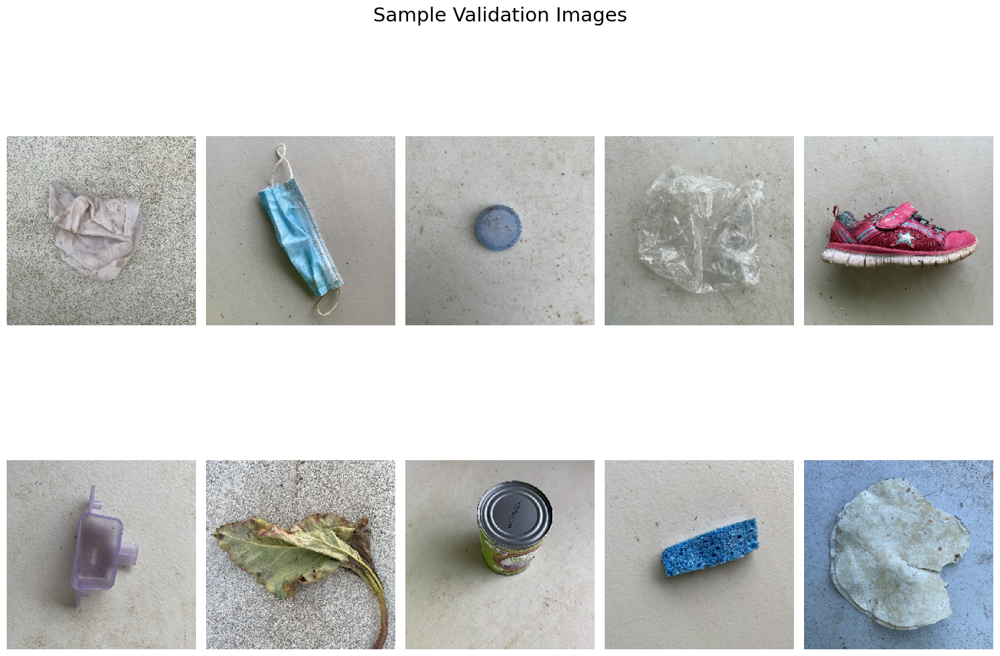

In [37]:
fig, ax = plt.subplots(nrows=2, ncols=5, figsize=(15, 12))
idx = 0

for i in range(2):
    for j in range(5):
        label = labels[np.argmax(valid_generator[0][1][idx])]
        ax[i, j].imshow(valid_generator[0][0][idx][:, :, :])
        ax[i, j].axis("off")
        idx += 1

plt.tight_layout()
plt.suptitle("Sample Validation Images", fontsize=21)
plt.show()

# Step 3 : Implementing CNN architectures for model building and training
- CNNs are deep,feedf forward neural networks which consists of several hidden layers and an output layer.
- The components of CNN are - **Convolutional layer, pooling(down-sampling) layer, flattening layer and fully connected layer**.
- **Classification**: Task of this project is to classify the images from the test dataset into 9 classes of landfill waste. 

## a. Simple CNN Model from scratch

In [38]:
def create_model():
    model = Sequential([
        
        Conv2D(filters=64, kernel_size=(3,3), padding='same', input_shape=(224, 224, 3)),
        Activation('relu'),
        MaxPooling2D(pool_size=(2, 2), strides=2),
        BatchNormalization(),
        Dropout(0.3),
        
        Conv2D(filters=128, kernel_size=(3, 3), padding='same'), #, kernel_regularizer=l2(0.001)),
        Activation('relu'),
        MaxPooling2D(pool_size=(2, 2), strides=2),
        BatchNormalization(),
        Dropout(0.4),
        
        Conv2D(filters=256, kernel_size=(3, 3), padding='same'), #, kernel_regularizer=l2(0.001)),
        Activation('relu'),
        MaxPooling2D(pool_size=(2, 2), strides=2),
        BatchNormalization(),
        Dropout(0.5),
        
        Conv2D(filters=512, kernel_size=(3, 3), padding='same'), #, kernel_regularizer=l2(0.001)),
        Activation('relu'),
        MaxPooling2D(pool_size=(2, 2), strides=2),
        BatchNormalization(),
        Dropout(0.5),
        
         # Fully Connected Layers
        Flatten(),
        Dense(units=256, activation='relu'), # , kernel_regularizer=l2(0.001)),
        BatchNormalization(),
        Dropout(0.5),
        Dense(units=128, activation='relu'), # , kernel_regularizer=l2(0.001)),
        BatchNormalization(),
        Dropout(0.5),
        Dense(units=64, activation='relu'), #, kernel_regularizer=l2(0.001)),
        BatchNormalization(),
        Dropout(0.5),
        Dense(units=9, activation='softmax')
    ])
    
    return model

In [39]:
cnn_model = create_model()
cnn_model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation (Activation)         │ (None, 224, 224, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 112, 112, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_1 (Activation)       │ (None, 112, 112, 128)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 56, 56, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_2 (Activation)       │ (None, 56, 56, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 28, 28, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_3 (Activation)       │ (None, 28, 28, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 14, 14, 512)    │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 100352)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │    25,690,368 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 256)            │         1,02

 Total params: 27,288,713 (104.10 MB)

 Trainable params: 27,285,897 (104.09 MB)

 Non-trainable params: 2,816 (11.00 KB)

In [40]:
callbacks = [ keras.callbacks.ModelCheckpoint("save_at_{epoch}.keras")]
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=np.sqrt(0.1), patience=5)

optimizer = Adam(learning_rate= 3e-4)

cnn_model.compile(optimizer= optimizer, loss='categorical_crossentropy', metrics=['accuracy'])
history = cnn_model.fit(train_generator, epochs= 25, validation_data = valid_generator,
                       verbose=1 ,callbacks=[reduce_lr])

Epoch 1/25


I0000 00:00:1730831820.775464     523 service.cc:145] XLA service 0x78c18c009b10 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1730831820.775534     523 service.cc:153]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0


  2/138 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.1719 - loss: 2.9628    

I0000 00:00:1730831839.961449     523 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


 24/138 ━━━━━━━━━━━━━━━━━━━━ 2:24 1s/step - accuracy: 0.1409 - loss: 3.1066 

I0000 00:00:1730831868.978194     523 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'input_reduce_fusion', 48 bytes spill stores, 48 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'input_reduce_select_fusion_2', 36 bytes spill stores, 36 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'input_reduce_reduce_window_fusion_4', 24 bytes spill stores, 24 bytes spill loads



138/138 ━━━━━━━━━━━━━━━━━━━━ 144s 824ms/step - accuracy: 0.1902 - loss: 2.8404 - val_accuracy: 0.1111 - val_loss: 4.2728 - learning_rate: 3.0000e-04
Epoch 2/25
138/138 ━━━━━━━━━━━━━━━━━━━━ 65s 444ms/step - accuracy: 0.2846 - loss: 2.3042 - val_accuracy: 0.1611 - val_loss: 4.1836 - learning_rate: 3.0000e-04
Epoch 3/25
138/138 ━━━━━━━━━━━━━━━━━━━━ 64s 441ms/step - accuracy: 0.3321 - loss: 2.0922 - val_accuracy: 0.1222 - val_loss: 3.7510 - learning_rate: 3.0000e-04
Epoch 4/25
138/138 ━━━━━━━━━━━━━━━━━━━━ 64s 443ms/step - accuracy: 0.3502 - loss: 1.9713 - val_accuracy: 0.1389 - val_loss: 3.5343 - learning_rate: 3.0000e-04
Epoch 5/25
138/138 ━━━━━━━━━━━━━━━━━━━━ 65s 446ms/step - accuracy: 0.3758 - loss: 1.8884 - val_accuracy: 0.2444 - val_loss: 2.4567 - learning_rate: 3.0000e-04
Epoch 6/25
138/138 ━━━━━━━━━━━━━━━━━━━━ 65s 450ms/step - accuracy: 0.4027 - loss: 1.7728 - val_accuracy: 0.3278 - val_loss: 2.0295 - learning_rate: 3.0000e-04
Epoch 7/25
138/138 ━━━━━━━━━━━━━━━━━━━━ 66s 454ms/step -

### Analysis: After 25 epochs, we got training accuracy ~ 65% and validation accuracy ~ 44%.

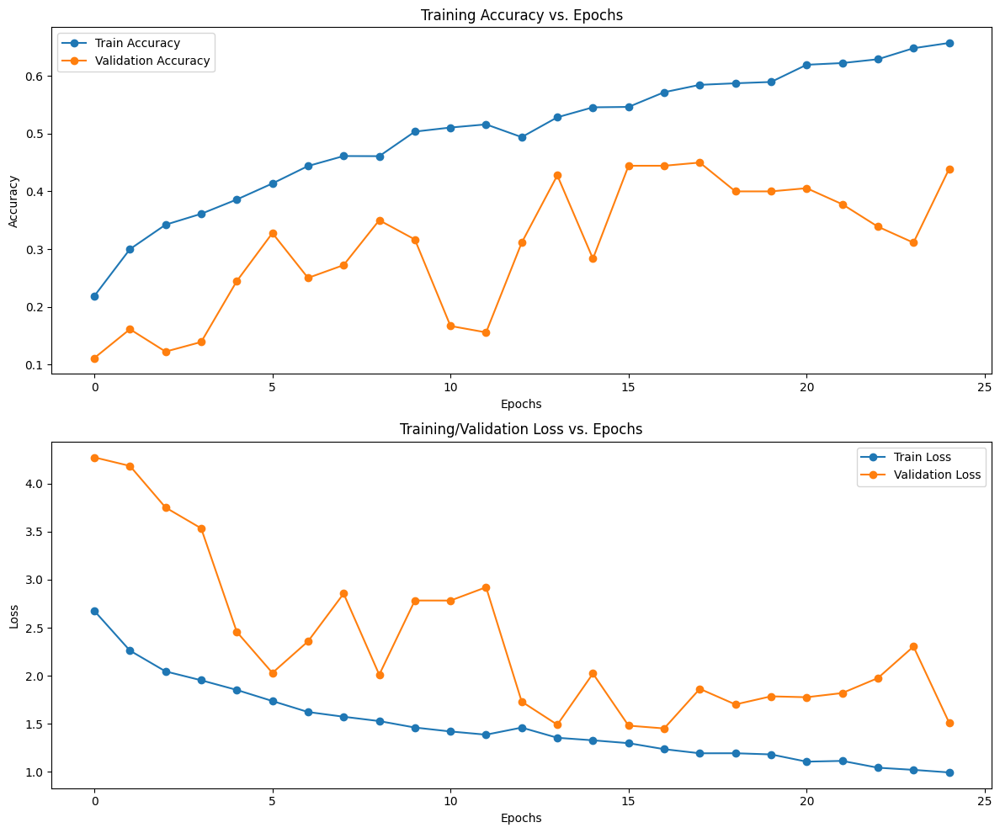

In [41]:
# Plotting the Model Metrics
train_accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']
train_loss = history.history['loss']
val_loss = history.history['val_loss']

fig, ax = plt.subplots(nrows=2, ncols=1, figsize=(12, 10))

ax[0].set_title('Training Accuracy vs. Epochs')
ax[0].plot(train_accuracy, 'o-', label='Train Accuracy')
ax[0].plot(val_accuracy, 'o-', label='Validation Accuracy')
ax[0].set_xlabel('Epochs')
ax[0].set_ylabel('Accuracy')
ax[0].legend(loc='best')

ax[1].set_title('Training/Validation Loss vs. Epochs')
ax[1].plot(train_loss, 'o-', label='Train Loss')
ax[1].plot(val_loss, 'o-', label='Validation Loss')
ax[1].set_xlabel('Epochs')
ax[1].set_ylabel('Loss')
ax[1].legend(loc='best')

plt.tight_layout()
plt.show()

### Balance Weights for Model Improvement
- The balanced weight is a widely used method for imbalanced classification models.
- It penalizes the minority classes by giving more weight to the loss function.


In [42]:
# The Dataset has different number of images in each class, hence used class weights to balance the dataset
from sklearn.utils import class_weight
train_labels = train_generator.classes
class_weights = class_weight.compute_class_weight(
    class_weight='balanced',
    classes=np.unique(train_labels),
    y=train_labels
)
class_weights_dict = dict(enumerate(class_weights))

In [43]:
history = cnn_model.fit(train_generator, epochs= 10, validation_data=valid_generator,
                        verbose=1,
                        class_weight=class_weights_dict, callbacks=[callbacks, reduce_lr]) 

Epoch 1/10
 69/138 ━━━━━━━━━━━━━━━━━━━━ 45s 663ms/step - accuracy: 0.6440 - loss: 1.0157

I0000 00:00:1730833797.433045     523 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'input_reduce_fusion', 48 bytes spill stores, 48 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'input_reduce_select_fusion_2', 36 bytes spill stores, 36 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'input_reduce_reduce_window_fusion_4', 24 bytes spill stores, 24 bytes spill loads



138/138 ━━━━━━━━━━━━━━━━━━━━ 98s 568ms/step - accuracy: 0.6518 - loss: 1.0029 - val_accuracy: 0.5833 - val_loss: 1.2317 - learning_rate: 9.4868e-05
Epoch 2/10
138/138 ━━━━━━━━━━━━━━━━━━━━ 70s 481ms/step - accuracy: 0.6715 - loss: 0.9836 - val_accuracy: 0.5944 - val_loss: 1.2203 - learning_rate: 9.4868e-05
Epoch 3/10
138/138 ━━━━━━━━━━━━━━━━━━━━ 70s 479ms/step - accuracy: 0.6750 - loss: 0.9378 - val_accuracy: 0.3944 - val_loss: 1.9727 - learning_rate: 9.4868e-05
Epoch 4/10
138/138 ━━━━━━━━━━━━━━━━━━━━ 67s 464ms/step - accuracy: 0.6743 - loss: 0.9359 - val_accuracy: 0.3278 - val_loss: 2.2301 - learning_rate: 9.4868e-05
Epoch 5/10
138/138 ━━━━━━━━━━━━━━━━━━━━ 69s 476ms/step - accuracy: 0.6543 - loss: 0.9594 - val_accuracy: 0.3278 - val_loss: 1.9794 - learning_rate: 9.4868e-05
Epoch 6/10
138/138 ━━━━━━━━━━━━━━━━━━━━ 70s 487ms/step - accuracy: 0.6756 - loss: 0.9426 - val_accuracy: 0.5278 - val_loss: 1.3839 - learning_rate: 9.4868e-05
Epoch 7/10
138/138 ━━━━━━━━━━━━━━━━━━━━ 69s 477ms/step - 

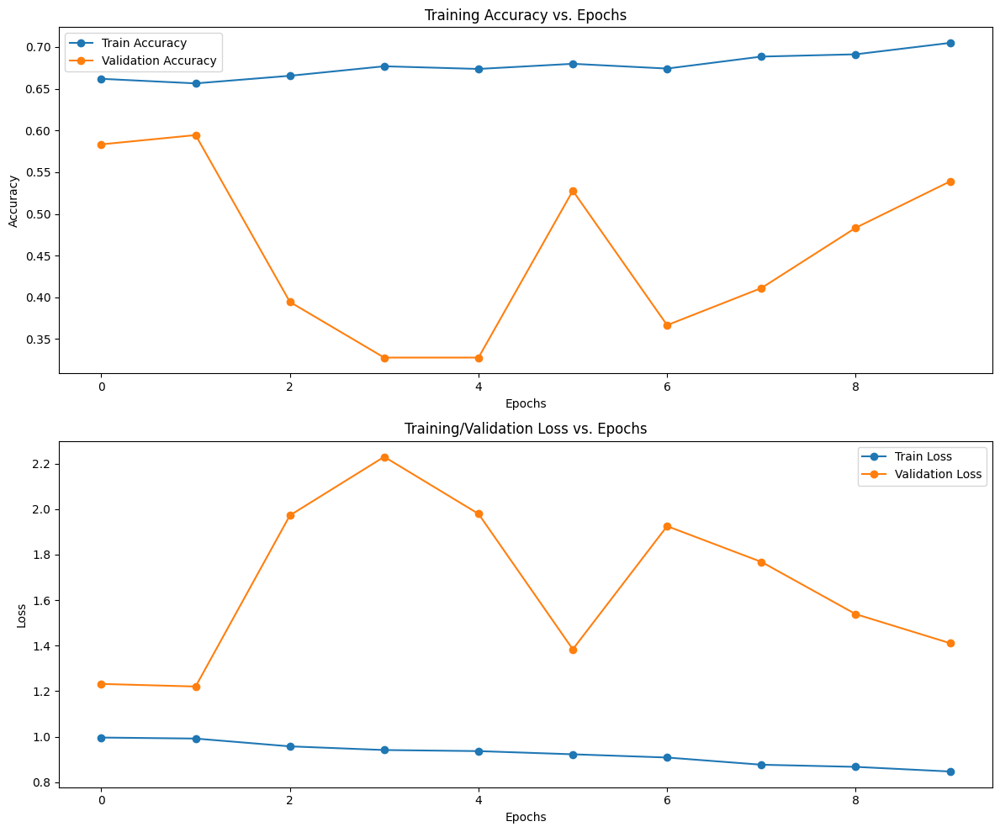

In [44]:
# Plotting the Model Metrics

train_accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']
train_loss = history.history['loss']
val_loss = history.history['val_loss']

fig, ax = plt.subplots(nrows=2, ncols=1, figsize=(12, 10))

ax[0].set_title('Training Accuracy vs. Epochs')
ax[0].plot(train_accuracy, 'o-', label='Train Accuracy')
ax[0].plot(val_accuracy, 'o-', label='Validation Accuracy')
ax[0].set_xlabel('Epochs')
ax[0].set_ylabel('Accuracy')
ax[0].legend(loc='best')

ax[1].set_title('Training/Validation Loss vs. Epochs')
ax[1].plot(train_loss, 'o-', label='Train Loss')
ax[1].plot(val_loss, 'o-', label='Validation Loss')
ax[1].set_xlabel('Epochs')
ax[1].set_ylabel('Loss')
ax[1].legend(loc='best')

plt.tight_layout()
plt.show()

### Analysis:
- From the above results and plots, we can see that there an improvement in the model performance after balancing the weights. 
- The accuracy and loss of the train and validation sets improved significantly. 

### Model Prediction on the Validation Dataset

In [47]:
predictions = cnn_model.predict(valid_generator)
val_acc, val_loss = cnn_model.evaluate(valid_generator, batch_size=32)

6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 142ms/step
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 139ms/step - accuracy: 0.5590 - loss: 1.3592


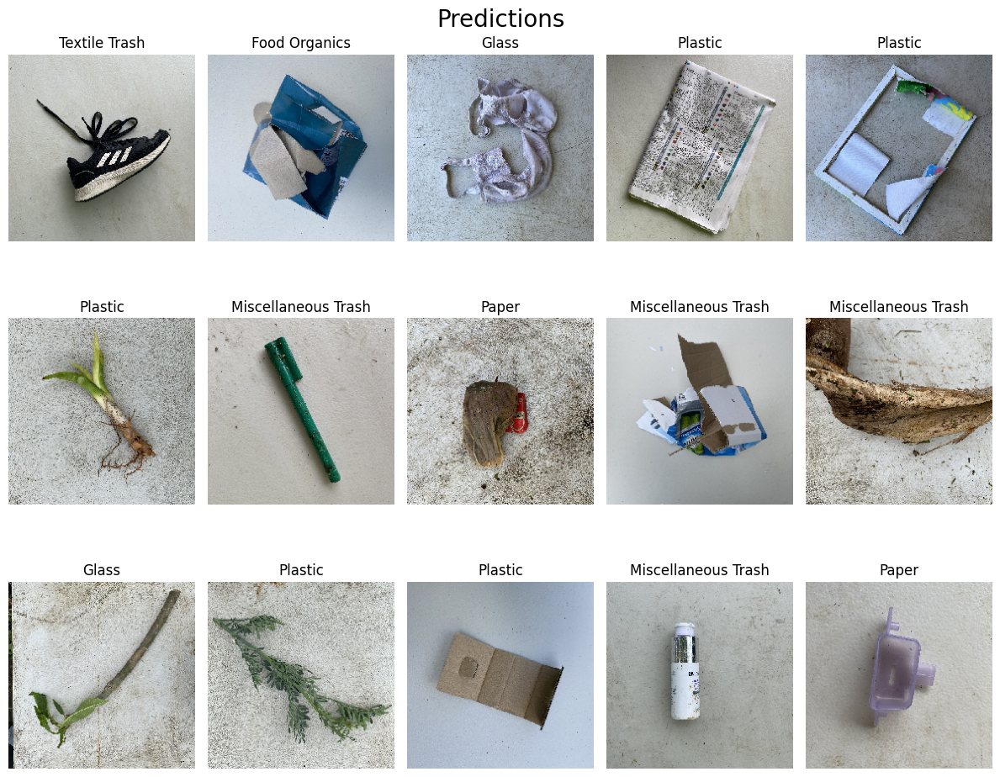

In [48]:
fig, ax = plt.subplots(nrows=3, ncols=5, figsize=(12, 10))
idx = 0

for i in range(3):
    for j in range(5):
        predicted_label = labels[np.argmax(predictions[idx])]
        ax[i, j].set_title(f"{predicted_label}")
        ax[i, j].imshow(valid_generator[0][0][idx])
        ax[i, j].axis("off")
        idx += 1

plt.tight_layout()
plt.suptitle("Predictions", fontsize=20)
plt.show()

### Classification Report
- Classsification report compares the actual and predicted labels for the validation dataset.
- Precision is the percentage of correct predictions for the predicted class.
- Recall is the percentage of samples captured by the model for the class.
- F1-score is the harmonic value of precision and recall. It is **2 x precision x recall/(precision+recall)**.
- Support has the count of samples for each class.

In [45]:
x_val, y_val = [], []
for i in range(len(valid_generator)):

    batch_x, batch_y = valid_generator[i]
    x_val.append(batch_x)
    y_val.append(batch_y)

x_val = np.concatenate(x_val)
y_val = np.concatenate(y_val)

y_pred = cnn_model.predict(x_val)

target_names = list(labels.values())
y_pred_classes = np.argmax(y_pred, axis=1)

print(classification_report(np.argmax(y_val, axis=1), y_pred_classes, target_names=target_names))

6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step
                     precision    recall  f1-score   support

          Cardboard       1.00      0.20      0.33        20
      Food Organics       0.75      0.30      0.43        20
              Glass       0.62      0.50      0.56        20
              Metal       1.00      0.20      0.33        20
Miscellaneous Trash       0.73      0.55      0.63        20
              Paper       1.00      0.75      0.86        20
            Plastic       0.22      0.95      0.36        20
      Textile Trash       0.78      0.70      0.74        20
         Vegetation       0.93      0.70      0.80        20

           accuracy                           0.54       180
          macro avg       0.78      0.54      0.56       180
       weighted avg       0.78      0.54      0.56       180



### Model Prediction on test image

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
[[1. 0. 0. 0. 0. 0. 0. 0. 0.]]
Predicted Label: Cardboard


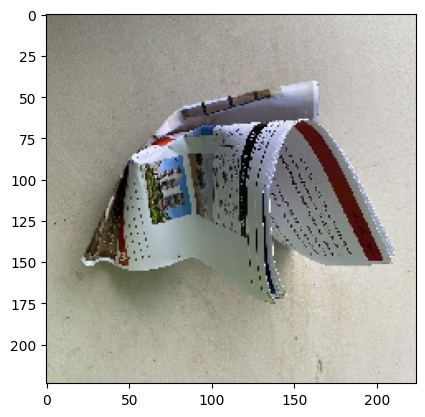

In [52]:
img = keras.utils.load_img("/kaggle/input/landfillwaste/prediction/Test/test_image_128.jpg" , target_size=target_size)
plt.imshow(img)

img_array = keras.utils.img_to_array(img)
img_array = keras.ops.expand_dims(img_array, 0)  # Create batch axis


y_proba = cnn_model.predict(img_array)
print(y_proba)

p_label = labels[np.argmax(y_proba)]
print("Predicted Label:",p_label)
   


### Report: We have build a cnn model from scratch with 4 layers and trainied it on the waste image dataset. Now let's try model building with pretrained models and see if there is any improvement in accuracy.


## b. Pretrained ResNet50 Model
- ResNet-50 is a pretrained Deep Learning model for image classification of the Convolutional Neural Network(CNN, or ConvNet), which is a class of deep neural networks, most commonly applied to analyzing visual imagery.
- ResNet-50 is 50 layers deep that enable it to learn much deeper architectures than previously possible without encountering the problem of vanishing gradients and is trained on a million images of 1000 categories from the ImageNet database. 
- Even though the ResNet is much deeper, the model size is actually substantially smaller due to the usage of global average pooling rather than fully-connected layers.
- Furthermore the model has over 23 million trainable parameters, which indicates a deep architecture that makes it better for image recognition.
- The architecture of ResNet50 is divided into four main parts: 
  - convolutional layers -  responsible for extracting features from the input image
  - identity block - process and transform these features
  - convolutional block - process and transform these features 
  - fully connected layers - make the final classification
  

 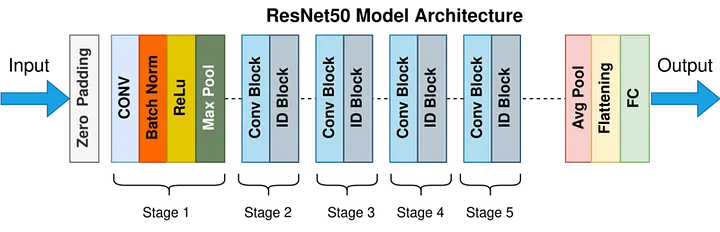


In [53]:
target_size = (224,224)
batch_size = 32

# Performing augmentation only on the training data
traingen = ImageDataGenerator(    
    preprocessing_function= tf.keras.applications.resnet50.preprocess_input  # preprocess
)

train_ds = traingen.flow_from_directory(train_images_path,
                                            batch_size= 32,
                                            shuffle=True,   
                                            seed = 100,
                                            class_mode='categorical',
                                            target_size= target_size
                                            )



Found 4392 images belonging to 9 classes.


In [54]:
validgen = ImageDataGenerator(preprocessing_function= tf.keras.applications.resnet50.preprocess_input) # preprocess
valid_ds = validgen.flow_from_directory(validation_images_path,
                                          shuffle=True,
                                          batch_size = 32,
                                          seed = 125,
                                          class_mode = 'categorical',
                                          target_size = (target_size) 
                                         )

Found 180 images belonging to 9 classes.


In [55]:
resnet50_model = ResNet50(input_shape=(224, 224, 3),
                          include_top=False,
                          weights='imagenet', pooling='avg')

# freezing the weights
for layer in resnet50_model.layers:
            layer.trainable=False
        

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [56]:
# Build the Model
#pool = tf.keras.layers.GlobalAveragePooling2D()(resnet50_model.output)
#flat = Flatten()(pool)
flat = Flatten()(resnet50_model.output)
# Add the last layer
output_layer = Dense(9, activation='softmax')(flat)
model1 = Model(inputs = resnet50_model.input, outputs = output_layer)

In [57]:
model1.compile(optimizer='adam',loss='categorical_crossentropy',metrics=['accuracy'])

In [59]:
callbacks = [
    ReduceLROnPlateau(monitor='val_accuracy', factor=0.1, patience=5, min_lr = 1e-6),
    EarlyStopping(monitor='val_accuracy', patience=5)     #,restore_best_weights=True)
]

history = model1.fit(train_ds,validation_data=valid_ds,epochs = 25,verbose= 1) #,callbacks=callbacks)

Epoch 1/25
138/138 ━━━━━━━━━━━━━━━━━━━━ 144s 989ms/step - accuracy: 0.5345 - loss: 1.3228 - val_accuracy: 0.7667 - val_loss: 0.6337
Epoch 2/25
138/138 ━━━━━━━━━━━━━━━━━━━━ 25s 172ms/step - accuracy: 0.8219 - loss: 0.5287 - val_accuracy: 0.8000 - val_loss: 0.5715
Epoch 3/25
138/138 ━━━━━━━━━━━━━━━━━━━━ 26s 177ms/step - accuracy: 0.8573 - loss: 0.4245 - val_accuracy: 0.7944 - val_loss: 0.5468
Epoch 4/25
138/138 ━━━━━━━━━━━━━━━━━━━━ 25s 170ms/step - accuracy: 0.8996 - loss: 0.3256 - val_accuracy: 0.8056 - val_loss: 0.4777
Epoch 5/25
138/138 ━━━━━━━━━━━━━━━━━━━━ 26s 178ms/step - accuracy: 0.9207 - loss: 0.2634 - val_accuracy: 0.8278 - val_loss: 0.4929
Epoch 6/25
138/138 ━━━━━━━━━━━━━━━━━━━━ 26s 179ms/step - accuracy: 0.9322 - loss: 0.2348 - val_accuracy: 0.8389 - val_loss: 0.4448
Epoch 7/25
138/138 ━━━━━━━━━━━━━━━━━━━━ 25s 176ms/step - accuracy: 0.9494 - loss: 0.1909 - val_accuracy: 0.8556 - val_loss: 0.4144
Epoch 8/25
138/138 ━━━━━━━━━━━━━━━━━━━━ 26s 178ms/step - accuracy: 0.9589 - loss: 

In [60]:
x_val, y_val = [], []
for i in range(len(valid_ds)):

    batch_x, batch_y = valid_ds[i]
    x_val.append(batch_x)
    y_val.append(batch_y)

x_val = np.concatenate(x_val)
y_val = np.concatenate(y_val)

y_pred = model1.predict(x_val)

target_names = list(labels.values())
y_pred_classes = np.argmax(y_pred, axis=1)

print(classification_report(np.argmax(y_val, axis=1), y_pred_classes, target_names=target_names))

6/6 ━━━━━━━━━━━━━━━━━━━━ 8s 797ms/step
                     precision    recall  f1-score   support

          Cardboard       0.95      0.90      0.92        20
      Food Organics       0.89      0.85      0.87        20
              Glass       1.00      0.85      0.92        20
              Metal       0.90      0.90      0.90        20
Miscellaneous Trash       0.81      0.85      0.83        20
              Paper       0.95      0.90      0.92        20
            Plastic       0.67      0.80      0.73        20
      Textile Trash       0.86      0.90      0.88        20
         Vegetation       0.90      0.90      0.90        20

           accuracy                           0.87       180
          macro avg       0.88      0.87      0.87       180
       weighted avg       0.88      0.87      0.87       180



{0: 'Cardboard', 1: 'Food Organics', 2: 'Glass', 3: 'Metal', 4: 'Miscellaneous Trash', 5: 'Paper', 6: 'Plastic', 7: 'Textile Trash', 8: 'Vegetation'}


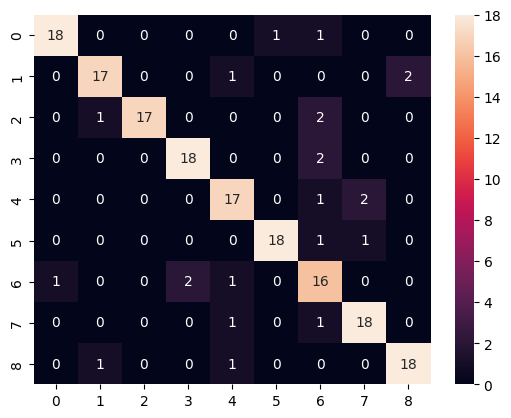

In [61]:
cm = confusion_matrix(np.argmax(y_val, axis=1), y_pred_classes)
sns.heatmap(cm, annot=True)
print(labels)

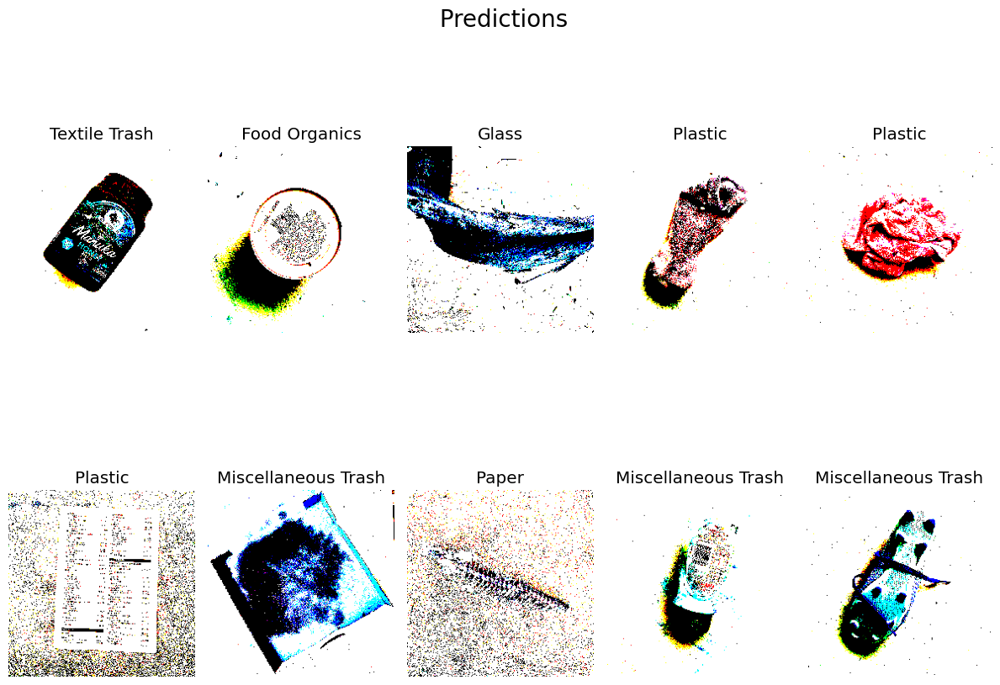

In [66]:
fig, ax = plt.subplots(nrows=2, ncols=5, figsize=(12, 10))
idx = 0

for i in range(2):
    for j in range(5):
        predicted_label = labels[np.argmax(predictions[idx])]
        ax[i, j].set_title(f"{predicted_label}")
        ax[i, j].imshow(valid_ds[0][0][idx])
        ax[i, j].axis("off")
        idx += 1

plt.tight_layout()
plt.suptitle(" Predictions", fontsize=20)
plt.show()

In [63]:
data_his = pd.DataFrame(history.history)
data_his

,accuracy,loss,val_accuracy,val_loss
0,0.657104,0.975829,0.766667,0.633704
1,0.821266,0.523713,0.800000,0.571467
2,0.857924,0.410283,0.794444,0.546818
3,0.896403,0.328716,0.805556,0.477678
4,0.915528,0.274697,0.827778,0.492904
5,0.929417,0.231373,0.838889,0.444812
6,0.944217,0.199482,0.855556,0.414446
7,0.953552,0.174231,0.838889,0.400130
8,0.962432,0.157035,0.855556,0.413901
9,0.969945,0.133369,0.866667,0.388286


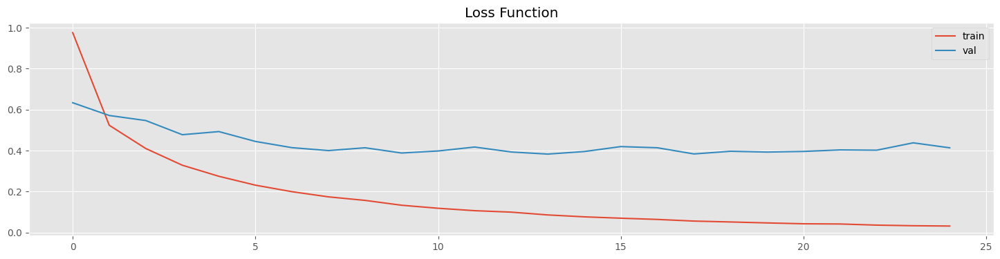

In [64]:
plt.style.use('ggplot')
fig = plt.figure(figsize=(18, 4))
plt.plot(data_his['loss'], label = 'train')
plt.plot(data_his['val_loss'], label = 'val')
plt.legend()
plt.title('Loss Function')
plt.show()
fig.savefig("Loss Function",dpi=700)

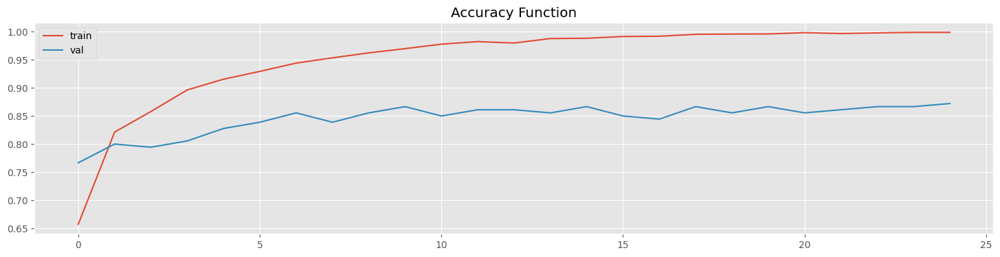

In [65]:
fig = plt.figure(figsize=(18, 4))
plt.plot(data_his['accuracy'], label = 'train')
plt.plot(data_his['val_accuracy'], label = 'val')
plt.legend()
plt.title('Accuracy Function')
plt.show()
fig.savefig("Accuracy Function",dpi=700)

### Model prediction on test image

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
The predicted class is Paper


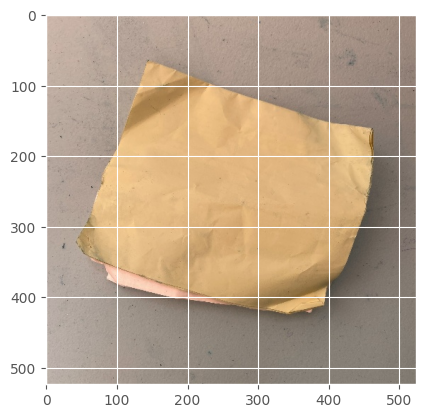

In [67]:
import cv2
image = cv2.imread("/kaggle/input/landfillwaste/prediction/Test/test_image_120.jpg")
plt.imshow(image)

image_resized = cv2.resize(image, (224, 224))
image = np.expand_dims(image_resized, axis=0)


# Make predictions
image_pred = model1.predict(image)


# Produce a human-readable output label
image_output_class = labels[np.argmax(image_pred)]
print("The predicted class is", image_output_class)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
Predicted class : Vegetation


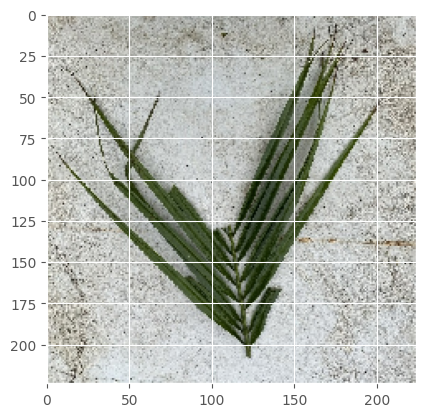

In [68]:
img = keras.utils.load_img("/kaggle/input/landfillwaste/prediction/Test/test_image_10.jpg" , target_size=target_size)
plt.imshow(img)

img_array = keras.utils.img_to_array(img)
img_array = keras.ops.expand_dims(img_array, 0)  # Create batch axis
img = keras.applications.resnet50.preprocess_input(img_array)

image_pred = model1.predict(img_array)

# Produce a human-readable output label
image_output_class = labels[np.argmax(image_pred)]
print("Predicted class :", image_output_class)



## c. Pretrained Xception Model
- This is a transfer learning clssification technique.
- Xception which stands for Extreme version of Inception with a modified version of depthwise seperable convolution is better than Inception-v3 for Image classification applications.
- The Xception model framework is composed of 14 groups. It has 36 convolutional layers that generates the feature extraction base of the model. 
- Each group has a linear residual connection, except for both the final and initial groups.
- The data pass which consists of three stages the entry flow,the middle flow which is replicated eight times and then comes the last stage the exit flow.
- The pretrained model was fine-tuned by setting all model’s weights to be trained. Then additional layers are added at the end of the Xception -base model.
- The layers are divided into 4 groups each contains a dense layer followed by a dropout layer of 0.2 then a BatchNormalization layer and ends with a ReLU activation function. 
- The values of dense layers are 512,128,52, and 16 respectively. 
- Then the model is ended with a softmax layer that classifies the input training images into 9 classes. 
- The RGB input images are resized to be 224 x 224 pixels. 
- We used ‘Adam’ as an adaptive optimizer with learning rate = 0.001(for top layers freezed) and 0.0001(for top layers unfreezed), and “categorical crossentropy” as a loss function.


In [69]:
target_size = (224,224)
batch_size = 32

# Performing augmentation only on the training data
train_gen = ImageDataGenerator(    
    preprocessing_function= tf.keras.applications.xception.preprocess_input  # preprocess
)

train_ds = train_gen.flow_from_directory(train_images_path,
                                            batch_size= 32,
                                            shuffle=True,   
                                            seed = 100,
                                            class_mode='categorical',
                                            target_size= target_size
                                            )



Found 4392 images belonging to 9 classes.


In [70]:
valid_gen = ImageDataGenerator(preprocessing_function= tf.keras.applications.xception.preprocess_input) # preprocess
valid_ds = valid_gen.flow_from_directory(validation_images_path,
                                          shuffle=True,
                                          batch_size = 32,
                                          seed = 125,
                                          class_mode = 'categorical',
                                          target_size = (target_size) 
                                         )

Found 180 images belonging to 9 classes.


-  Let's load an Xception model pretrained on ImageNet.
-  We exclude the top of the layer of the network by setting include-top = False, this excludes the global average pooling layer and the dense layer.
-  We then add our  own global average pooling layer, based on the output of the model, followed by a dense layer with 1 unit per class, using the softmax function.
-  It is usually a good idea to freeze the weights of the pretrained layers in the beginning of training, to avoid large error gradients that may wreck the reused weights.
-  Freezing during the few intial epochs gives the new layer some time to learn reasonable weights.

In [71]:
xception_model = Xception(
                    include_top=False,
                    weights='imagenet',
                   )

pooling = keras.layers.GlobalAveragePooling2D()(xception_model.output)
output_layer = Dense(9 , activation ="softmax")(pooling)
model2 = Model(inputs = xception_model.input , outputs = output_layer)


for layer in xception_model.layers:
    layer.trainable = False

83683744/83683744 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [73]:
#optimizer = keras.optimizers.SGD(learning_rate = 0.2 , momentum = 0.9 , decay = 0.01)
model2.compile(optimizer='adam',loss='categorical_crossentropy',metrics=['accuracy'])     

In [74]:
callbacks = tf.keras.callbacks.EarlyStopping(monitor='val_loss',mode ='min', patience=3,restore_best_weights=True)
history = model2.fit(train_ds,validation_data=valid_ds, epochs = 25, callbacks = callbacks)

Epoch 1/25
138/138 ━━━━━━━━━━━━━━━━━━━━ 68s 374ms/step - accuracy: 0.4824 - loss: 1.4584 - val_accuracy: 0.7667 - val_loss: 0.7607
Epoch 2/25
138/138 ━━━━━━━━━━━━━━━━━━━━ 39s 240ms/step - accuracy: 0.7420 - loss: 0.7429 - val_accuracy: 0.7778 - val_loss: 0.6750
Epoch 3/25
138/138 ━━━━━━━━━━━━━━━━━━━━ 33s 232ms/step - accuracy: 0.8049 - loss: 0.5979 - val_accuracy: 0.7611 - val_loss: 0.6369
Epoch 4/25
138/138 ━━━━━━━━━━━━━━━━━━━━ 34s 238ms/step - accuracy: 0.8389 - loss: 0.4979 - val_accuracy: 0.8000 - val_loss: 0.6210
Epoch 5/25
138/138 ━━━━━━━━━━━━━━━━━━━━ 39s 239ms/step - accuracy: 0.8672 - loss: 0.4300 - val_accuracy: 0.7944 - val_loss: 0.6336
Epoch 6/25
138/138 ━━━━━━━━━━━━━━━━━━━━ 33s 232ms/step - accuracy: 0.8707 - loss: 0.4210 - val_accuracy: 0.8000 - val_loss: 0.5923
Epoch 7/25
138/138 ━━━━━━━━━━━━━━━━━━━━ 34s 237ms/step - accuracy: 0.8866 - loss: 0.3748 - val_accuracy: 0.7889 - val_loss: 0.5968
Epoch 8/25
138/138 ━━━━━━━━━━━━━━━━━━━━ 38s 265ms/step - accuracy: 0.9038 - loss: 0

In [75]:
x_val, y_val = [], []
for i in range(len(valid_ds)):

    batch_x, batch_y = valid_ds[i]
    x_val.append(batch_x)
    y_val.append(batch_y)

x_val = np.concatenate(x_val)
y_val = np.concatenate(y_val)

y_pred = model2.predict(x_val)

target_names = list(labels.values())
y_pred_classes = np.argmax(y_pred, axis=1)

print(classification_report(np.argmax(y_val, axis=1), y_pred_classes, target_names=target_names))

6/6 ━━━━━━━━━━━━━━━━━━━━ 5s 574ms/step
                     precision    recall  f1-score   support

          Cardboard       0.84      0.80      0.82        20
      Food Organics       0.90      0.90      0.90        20
              Glass       0.93      0.65      0.76        20
              Metal       0.64      0.80      0.71        20
Miscellaneous Trash       0.78      0.70      0.74        20
              Paper       0.82      0.90      0.86        20
            Plastic       0.64      0.70      0.67        20
      Textile Trash       0.84      0.80      0.82        20
         Vegetation       0.90      0.95      0.93        20

           accuracy                           0.80       180
          macro avg       0.81      0.80      0.80       180
       weighted avg       0.81      0.80      0.80       180



1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
Predicted class : Food Organics


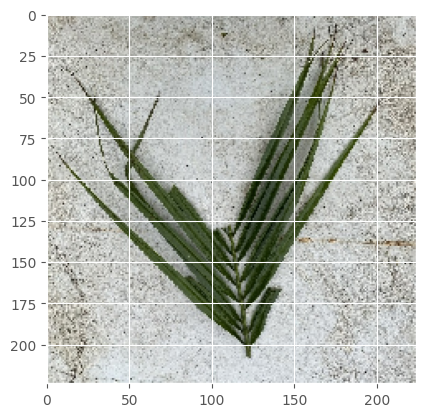

In [114]:
img = keras.utils.load_img("/kaggle/input/landfillwaste/prediction/Test/test_image_10.jpg" , target_size=target_size)
plt.imshow(img)

img_array = keras.utils.img_to_array(img)
img_array = keras.ops.expand_dims(img_array, 0)  # Create batch axis
img = tf.keras.applications.xception.preprocess_input(img_array)

image_pred = model2.predict(img_array)

# Produce a human-readable output label
image_output_class = labels[np.argmax(image_pred)]
print("Predicted class :", image_output_class)

In [81]:
data_his = pd.DataFrame(history.history)
data_his

,accuracy,loss,val_accuracy,val_loss
0,0.610883,1.118333,0.766667,0.760722
1,0.768898,0.696659,0.777778,0.675025
2,0.810109,0.578279,0.761111,0.636930
3,0.836293,0.505991,0.800000,0.621011
4,0.850410,0.453223,0.794444,0.633553
5,0.866120,0.418732,0.800000,0.592274
6,0.882286,0.376334,0.788889,0.596770
7,0.893898,0.343946,0.788889,0.626706
8,0.905055,0.318795,0.816667,0.586525
9,0.917577,0.298327,0.827778,0.577955


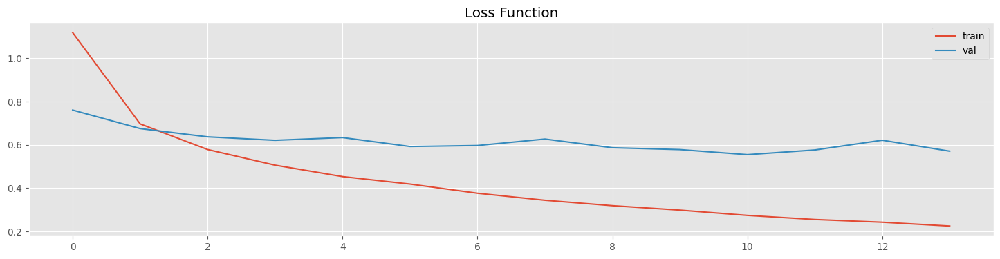

In [82]:
plt.style.use('ggplot')
fig = plt.figure(figsize=(18, 4))
plt.plot(data_his['loss'], label = 'train')
plt.plot(data_his['val_loss'], label = 'val')
plt.legend()
plt.title('Loss Function')
plt.show()
fig.savefig("Loss Function",dpi=700)

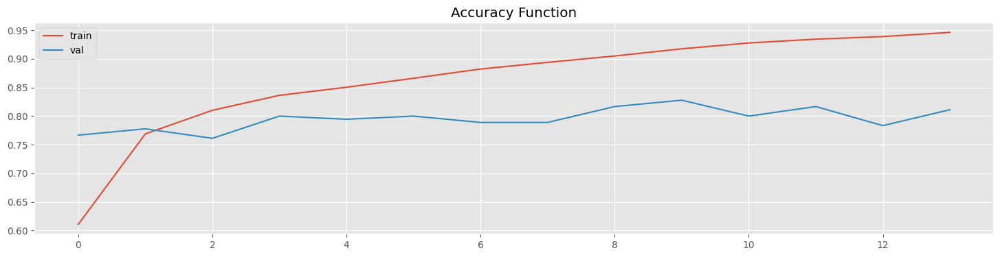

In [83]:
fig = plt.figure(figsize=(18, 4))
plt.plot(data_his['accuracy'], label = 'train')
plt.plot(data_his['val_accuracy'], label = 'val')
plt.legend()
plt.title('Accuracy Function')
plt.show()
fig.savefig("Accuracy Function",dpi=700)

### The validation accuracy reached to 80-82% after training the model for 10 epochs. 
### This means the top layers are now well trained, so now let's unfreeze all the layers and continue the training.
### We must lower the learning rate to avoid damaging the pretrained weights.

In [85]:
for layer in xception_model.layers:
    layer.trainable = True

In [86]:
optimizer = Adam(learning_rate= 1e-4)
model2.compile(optimizer=optimizer,loss='categorical_crossentropy',metrics=['accuracy'])     

In [87]:
#callbacks = tf.keras.callbacks.EarlyStopping(monitor='val_loss',mode ='min', verbose =1) #, patience=3,restore_best_weights=True
history = model2.fit(train_ds,validation_data=valid_ds, epochs =10)  # , callbacks=[callbacks])

Epoch 1/10
 40/138 ━━━━━━━━━━━━━━━━━━━━ 1:03 650ms/step - accuracy: 0.7278 - loss: 0.8470

I0000 00:00:1730839036.735372     523 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'input_reduce_select_fusion', 488 bytes spill stores, 488 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'input_reduce_fusion_1', 16 bytes spill stores, 16 bytes spill loads



138/138 ━━━━━━━━━━━━━━━━━━━━ 107s 403ms/step - accuracy: 0.7868 - loss: 0.6493 - val_accuracy: 0.8556 - val_loss: 0.3798
Epoch 2/10
138/138 ━━━━━━━━━━━━━━━━━━━━ 38s 260ms/step - accuracy: 0.9830 - loss: 0.0751 - val_accuracy: 0.9111 - val_loss: 0.2835
Epoch 3/10
138/138 ━━━━━━━━━━━━━━━━━━━━ 37s 260ms/step - accuracy: 0.9996 - loss: 0.0211 - val_accuracy: 0.8889 - val_loss: 0.3173
Epoch 4/10
138/138 ━━━━━━━━━━━━━━━━━━━━ 37s 260ms/step - accuracy: 0.9995 - loss: 0.0112 - val_accuracy: 0.8833 - val_loss: 0.3616
Epoch 5/10
138/138 ━━━━━━━━━━━━━━━━━━━━ 37s 260ms/step - accuracy: 0.9991 - loss: 0.0079 - val_accuracy: 0.8889 - val_loss: 0.3733
Epoch 6/10
138/138 ━━━━━━━━━━━━━━━━━━━━ 37s 260ms/step - accuracy: 0.9978 - loss: 0.0120 - val_accuracy: 0.9000 - val_loss: 0.3502
Epoch 7/10
138/138 ━━━━━━━━━━━━━━━━━━━━ 37s 261ms/step - accuracy: 0.9991 - loss: 0.0065 - val_accuracy: 0.8778 - val_loss: 0.3797
Epoch 8/10
138/138 ━━━━━━━━━━━━━━━━━━━━ 37s 260ms/step - accuracy: 0.9991 - loss: 0.0061 - va

In [88]:
x_val, y_val = [], []
for i in range(len(valid_ds)):

    batch_x, batch_y = valid_ds[i]
    x_val.append(batch_x)
    y_val.append(batch_y)

x_val = np.concatenate(x_val)
y_val = np.concatenate(y_val)

y_pred = model2.predict(x_val)

target_names = list(labels.values())
y_pred_classes = np.argmax(y_pred, axis=1)

print(classification_report(np.argmax(y_val, axis=1), y_pred_classes, target_names=target_names))

6/6 ━━━━━━━━━━━━━━━━━━━━ 5s 531ms/step
                     precision    recall  f1-score   support

          Cardboard       0.90      0.95      0.93        20
      Food Organics       1.00      0.95      0.97        20
              Glass       1.00      0.90      0.95        20
              Metal       0.82      0.90      0.86        20
Miscellaneous Trash       0.68      0.65      0.67        20
              Paper       0.89      0.85      0.87        20
            Plastic       0.78      0.90      0.84        20
      Textile Trash       0.79      0.75      0.77        20
         Vegetation       0.95      0.95      0.95        20

           accuracy                           0.87       180
          macro avg       0.87      0.87      0.87       180
       weighted avg       0.87      0.87      0.87       180



{0: 'Cardboard', 1: 'Food Organics', 2: 'Glass', 3: 'Metal', 4: 'Miscellaneous Trash', 5: 'Paper', 6: 'Plastic', 7: 'Textile Trash', 8: 'Vegetation'}


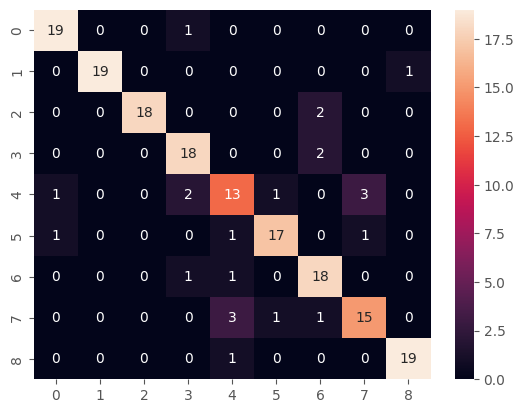

In [89]:
cm = confusion_matrix(np.argmax(y_val, axis=1), y_pred_classes)
sns.heatmap(cm, annot=True)
print(labels)

In [90]:
data_his = pd.DataFrame(history.history)
data_his

,accuracy,loss,val_accuracy,val_loss
0,0.829918,0.505769,0.855556,0.379783
1,0.982468,0.073622,0.911111,0.283527
2,0.998406,0.020245,0.888889,0.317337
3,0.999545,0.010427,0.883333,0.361557
4,0.997495,0.012308,0.888889,0.373280
5,0.999317,0.007374,0.900000,0.350235
6,0.998406,0.007651,0.877778,0.379747
7,0.999089,0.006200,0.894444,0.396676
8,0.998634,0.005052,0.883333,0.379754
9,0.999317,0.005204,0.866667,0.359096


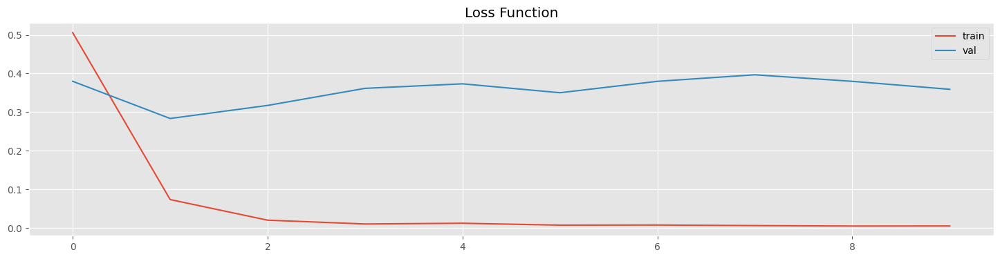

In [91]:
plt.style.use('ggplot')
fig = plt.figure(figsize=(18, 4))
plt.plot(data_his['loss'], label = 'train')
plt.plot(data_his['val_loss'], label = 'val')
plt.legend()
plt.title('Loss Function')
plt.show()
fig.savefig("Loss Function",dpi=700)

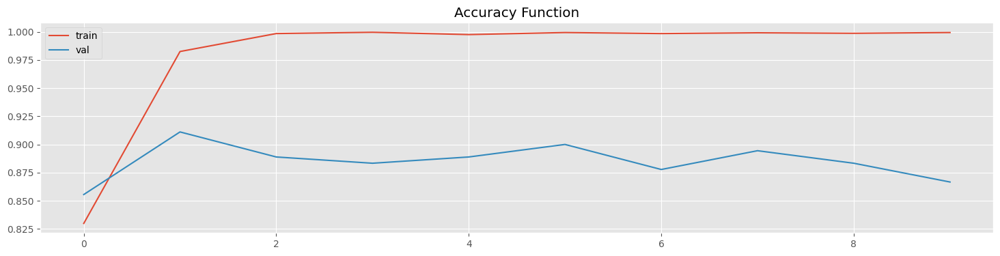

In [92]:
fig = plt.figure(figsize=(18, 4))
plt.plot(data_his['accuracy'], label = 'train')
plt.plot(data_his['val_accuracy'], label = 'val')
plt.legend()
plt.title('Accuracy Function')
plt.show()
fig.savefig("Accuracy Function",dpi=700)

### Model testing on a sample test image

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
Predicted class : Miscellaneous Trash


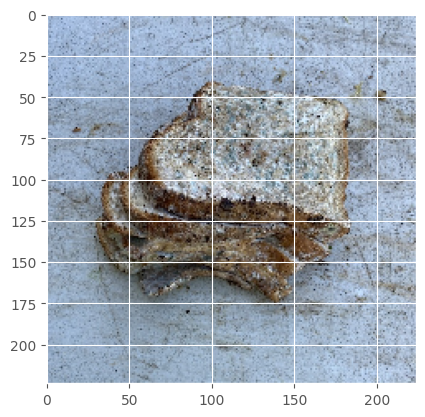

In [100]:
img = keras.utils.load_img("/kaggle/input/landfillwaste/prediction/Test/test_image_1.jpg" , target_size=target_size)
plt.imshow(img)

img_array = keras.utils.img_to_array(img)
img_array = keras.ops.expand_dims(img_array, 0)  # Create batch axis
img = tf.keras.applications.xception.preprocess_input(img_array)

image_pred = model2.predict(img_array)

# Produce a human-readable output label
image_output_class = labels[np.argmax(image_pred)]
print("Predicted class :", image_output_class)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
Predicted class : Miscellaneous Trash


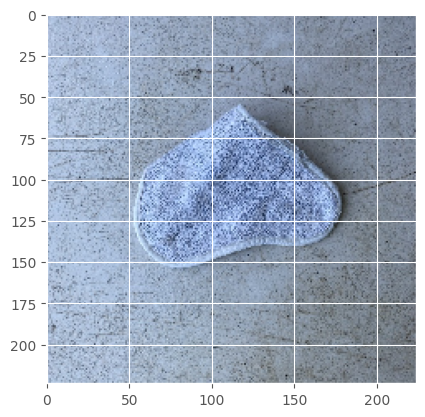

In [117]:
img = keras.utils.load_img("/kaggle/input/landfillwaste/prediction/Test/test_image_84.jpg" , target_size=target_size)
plt.imshow(img)

img_array = keras.utils.img_to_array(img)
img_array = keras.ops.expand_dims(img_array, 0)  # Create batch axis
img = tf.keras.applications.xception.preprocess_input(img_array)

image_pred = model2.predict(img_array)

# Produce a human-readable output label
image_output_class = labels[np.argmax(image_pred)]
print("Predicted class :", image_output_class)

## Results and Conclusions
- From the above study and results, for multilabel image classification applications, pretrained models work better than a scratch cnn model. 
- The training time along with accuracy and loss is better with pretrained modelss
- We could further incresae the size of the training data(by augmentation or collecting mopre pictures) and number of epochs to check for imporovement on the validation accuracy and loss.
- Overall among the 3 models used, resNet50 appears to classify images well on the test set than the opther 2 models.
- | Model                        |Training_Accuracy| Validation_Accuracy | Train_loss| validation_Loss|Epochs|
  | :--------------------------:|:-----------------:|:-------------------:|:---------:|:--------------:|:----:|
  | CNN(scratch)                 |    0.6548              |0.4389                  | 1.0011          |  1.5126         |25    |
  | CNN_weights_balanced         |    0.7145              |0.5389              | 0.8244          |  1.4109           |10    |
  | ResNet50                     |    0.9996              | 0.8722                |      0.0305     |  0.4137        |25    |
  | Xception_top_layers_freezed  |  0.9430                |0.8111               | 0.2225          |  0.5706        | 25   |
  | Xception_top_layers_unfreezed|  0.9979             | 0.8667               | 0.0119          |  0.3591        | 10   |
